

**Тема: Обнаружение объектов с использованием Faster R-CNN**

**Цель работы:** Ознакомиться с архитектурой Faster R-CNN и принципами двухэтапного обнаружения объектов.

**Задачи:**
- Изучить теоретические основы двухэтапного обнаружения объектов: роль RPN и классификационного этапа в Faster R-CNN.
- Загрузить предобученную модель Faster R-CNN.
- Ознакомиться с форматом аннотаций для обучения в задаче детекции.
- Визуализировать предсказания, проанализировать ошибки модели и провести исследование по поиску баланса FN/FP.

### 1. Теоретическая часть

В данной лабораторной работе мы познакомимся с задачей детекции на примере архитектуры [Faster R-CNN](https://arxiv.org/pdf/1506.01497), обученной на наборе данных [COCO](https://cocodataset.org/#home), а также с новым форматом данных для обучения нейро-сетевых моделей детекции. Для оценки модели воспользуемся любым скачанным набором данных.

**Перед тем, как приступать к выполнению практической части, ознакомьтесь с первоисточниками используемых компонентов, а также документацией по [ссылке](https://pytorch.org/vision/master/models/faster_rcnn.html), включающей подробности работы с моделью и новым форматом данных, сэмплы кода.**

#### 1.1 Архитектура Faster R-CNN

Существует два основных подхода к обнаружению объектов:
Двухстадийные модели – более точные, но медленные.
Одностадийные модели – быстрые, но менее точные.

Faster R-CNN — это двухэтапная модель детекции объектов. В отличие от ResNeXt, Faster R-CNN не просто классифицирует изображение, а находит на нём несколько объектов, предсказывает bounding boxes и присваивает метки классам. Она состоит из следующих компонентов:

1. Backbone (ResNet/VGG/MobileNet) – извлекает признаки из изображения.
2. Region Proposal Network (RPN) – предлагает области, где могут находиться объекты.
3. ROI Pooling + Fully Connected Layers – классифицирует объекты и уточняет bounding boxes.
4. Non-Maximum Suppression (NMS) – убирает дублирующиеся предсказания.


В предыдущих лабораторных работах мы познакомились с классификацией изображений, где модель предсказывает единственный класс для всего изображения. Однако во многих задачах компьютерного зрения классификация недостаточна. Например, когда на одном изображении присутствуют несколько объектов разных классов необходимо не только определить, что изображено, но и где это находится.

Faster R-CNN –  модель, которая также решает задачу обнаружения объектов, добавляя к классификации локализацию. 

#### 1.2 Формат данных для задачи детекции

Faster R-CNN требует разметки изображений, помимо классов включающей в себя и координаты bounding box по оси x, y.


#### 1.3 Оценка качества

Помимо известных вам инструментов оценить качество работы детектора могут помочь:

Confidence Score - значение, указывающее на уверенность модели в том, что на данном месте изображения находится объект. Модель предсказывает этот параметр для каждого предсказанного bounding box. Чем выше confidence score, тем более уверена модель в своём предсказании.

Фильтрация предсказаний - модель может предсказать много объектов, но не все из них будут точными. Чтобы уменьшить количество ложных срабатываний (False Positives), применяется фильтр предсказаний, используя confidence threshold. Если confidence score меньше заданного порога - предсказание отбрасывается.


### 2. Практическая часть

#### 2.1 Подготовка окружения

Установите зависимости и библиотеки:

In [1]:
# импорт пакетов
import os, random
import numpy as np
import torch
import torchvision
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.transforms import functional as F

print("numpy:", np.__version__)
print("torch:", torch.__version__)
print("torchvision:", torchvision.__version__)

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

numpy: 1.26.4
torch: 2.8.0+cpu
torchvision: 0.23.0+cpu
Using device: cpu


#### 2.2 Подготовка модели

Загрузите предобученную модель, определите устройство, переведите модель в режим инференса:

In [2]:
# импорт модели
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn(weights=weights)
model.to(device)
model.eval()

COCO_CLASSES = weights.meta["categories"]
print("Количество классов:", len(COCO_CLASSES))

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to C:\Users\podzo/.cache\torch\hub\checkpoints\fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [12:37<00:00, 221kB/s]  

Количество классов: 91


#### 2.3 Загрузка и предобработка изображений


Затем импортируйте датасет из соответствующих пакетов PyTorch и определите метод трансформации данных для подачи в модель. Он понадобится позже для преобразования изображений при прямом проходе через модель чтобы получить предсказания:

In [3]:
# загрузка датасета
from torchvision.datasets import CocoDetection

COCO_ROOT = r"datasets/coco2017"
IMG_DIR = os.path.join(COCO_ROOT, "val2017")
ANN_FILE = os.path.join(COCO_ROOT, "annotations", "instances_val2017.json")

assert os.path.isdir(IMG_DIR)
assert os.path.isfile(ANN_FILE)

dataset = CocoDetection(root=IMG_DIR, annFile=ANN_FILE)
coco_api = dataset.coco

print("Размер COCO val:", len(dataset))

loading annotations into memory...
Done (t=0.51s)
creating index...
index created!
Размер COCO val: 5000


#### 2.4 Объявление методов для работы с данными

Далее необходимо создать методы препроцессинга: метод чтения файла аннотации для возврата numpy-объекта содержащего bounding boxes, и метод отрисовки истиных и прогнозных bounding boxes на изображении для визуализации полученных результатов.

In [4]:
def xywh_to_xyxy(b):
    x, y, w, h = b
    return np.array([x, y, x + w, y + h], dtype=float)

def build_gt_boxes(idx):
    img, anns = dataset[idx]
    gt_boxes = []
    gt_labels = []

    for ann in anns:
        if "bbox" not in ann:
            continue
        gt_boxes.append(xywh_to_xyxy(ann["bbox"]))
        gt_labels.append(int(ann["category_id"]))

    return img, np.array(gt_boxes), np.array(gt_labels)

def draw_boxes(img, boxes, labels, scores=None, color="red"):
    out = img.copy()
    dr = ImageDraw.Draw(out)

    for i, b in enumerate(boxes):
        x1, y1, x2, y2 = [int(v) for v in b]
        dr.rectangle([x1, y1, x2, y2], outline=color, width=2)

        name = str(labels[i])
        if scores is not None:
            name += f" {scores[i]:.2f}"
        dr.text((x1, max(0, y1-12)), name, fill=color)

    return out

@torch.no_grad()
def predict_one(img):
    x = F.to_tensor(img).to(device)
    pred = model([x])[0]
    return {
        "boxes": pred["boxes"].cpu().numpy(),
        "labels": pred["labels"].cpu().numpy(),
        "scores": pred["scores"].cpu().numpy()
    }

#### 2.5 Анализ False Positives / False Negatives

Для измерения того, насколько хорошо bounding box предсказан, применяется параметр IoU (Intersection over Union) между двумя bounding boxes. Чем он выше, тем точнее предсказание. Для его оценки опишем следующий метод, принимающий два np.array-объекта (прогнозные и истинные координаты):

In [5]:
def box_iou(a, b):
    xA = max(a[0], b[0])
    yA = max(a[1], b[1])
    xB = min(a[2], b[2])
    yB = min(a[3], b[3])

    interW = max(0, xB - xA)
    interH = max(0, yB - yA)
    inter = interW * interH

    areaA = (a[2]-a[0]) * (a[3]-a[1])
    areaB = (b[2]-b[0]) * (b[3]-b[1])

    union = areaA + areaB - inter
    return inter / union if union > 0 else 0

def match_by_iou(pred_boxes, gt_boxes, iou_thr=0.5):
    tp = 0
    used = set()

    for g in gt_boxes:
        best_iou = 0
        best_idx = -1
        for i, p in enumerate(pred_boxes):
            if i in used:
                continue
            iou = box_iou(p, g)
            if iou > best_iou:
                best_iou = iou
                best_idx = i
        if best_iou >= iou_thr:
            tp += 1
            used.add(best_idx)

    fp = len(pred_boxes) - tp
    fn = len(gt_boxes) - tp
    return tp, fp, fn

#### 2.6 Оценка модели и визуализация результатов

Выполните прямой проход нескольких изображений через модель. Для этого необходимо загрузить изображения и аннотации, применить преобразование изображений в тензор. Затем получите выходы модели:

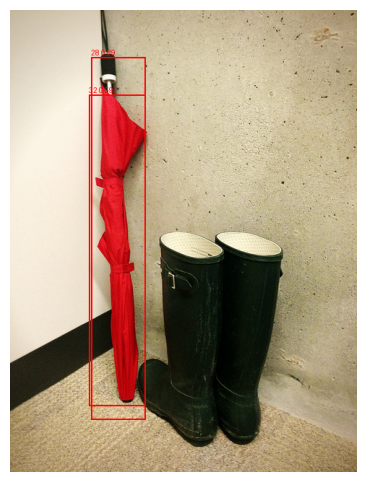

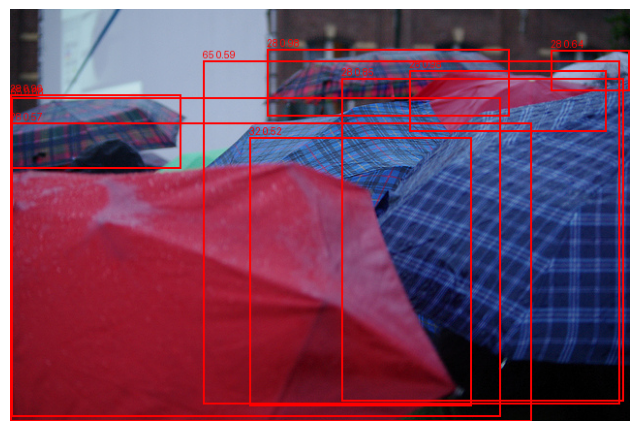

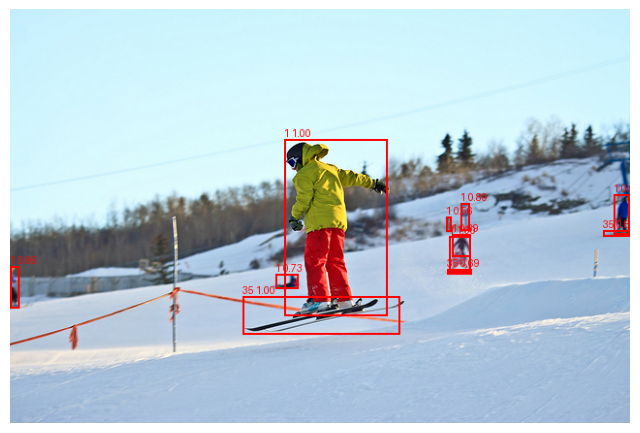

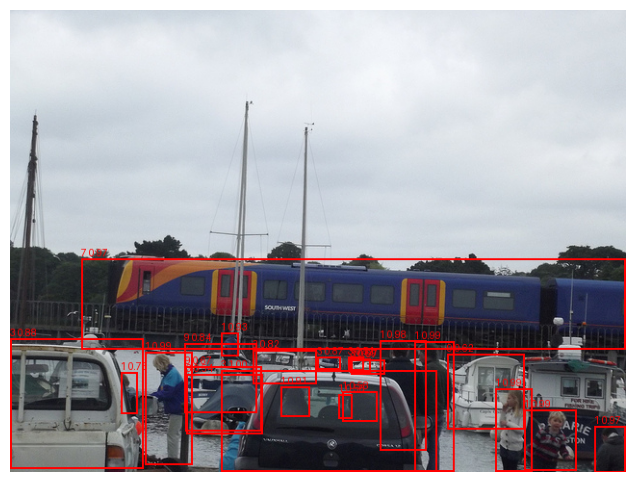

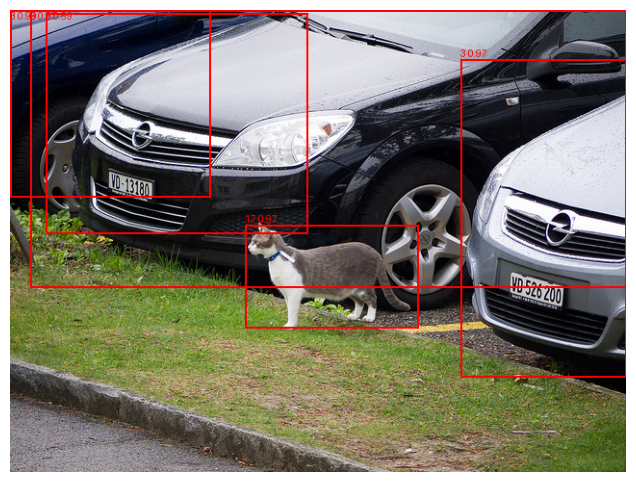

...

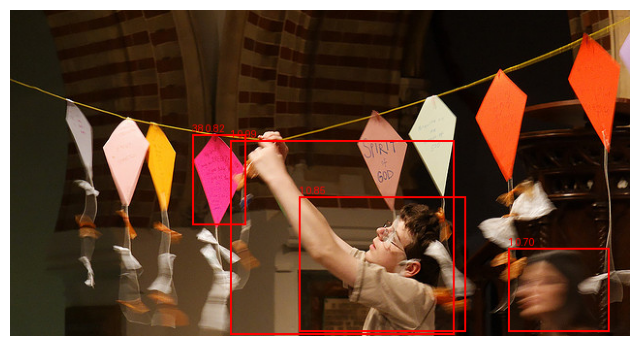

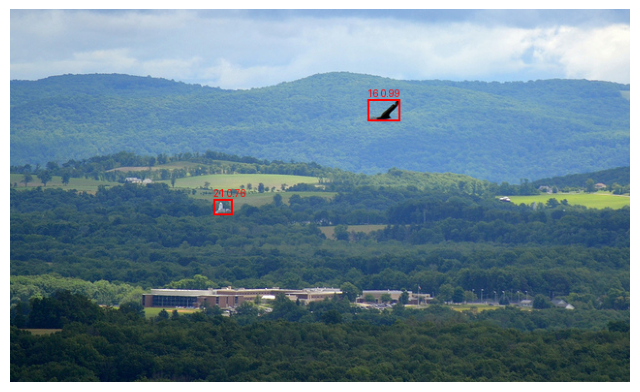

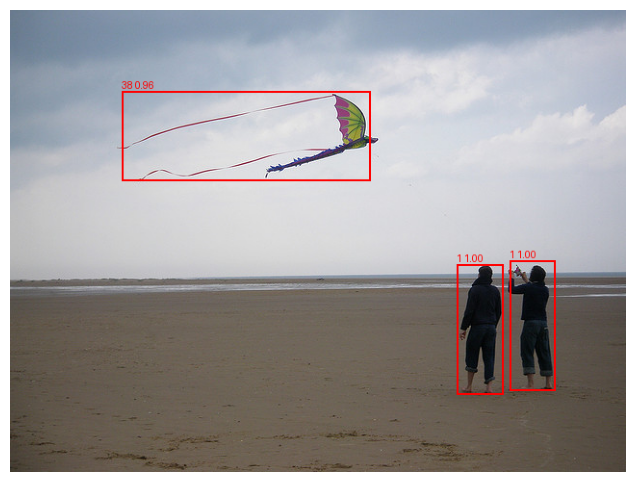

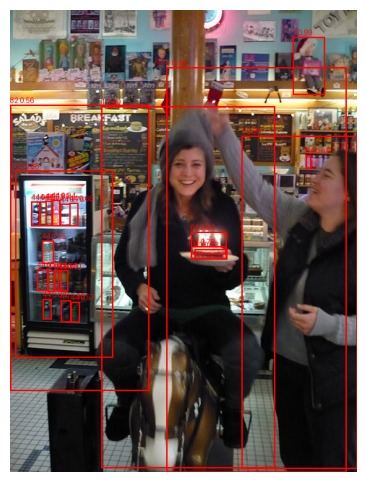

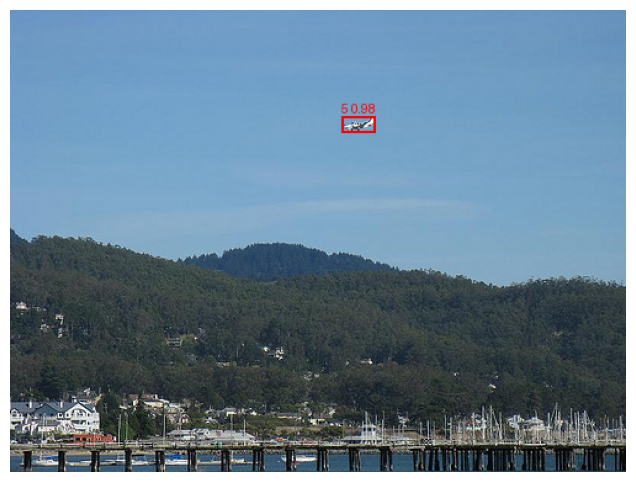

TP: 92
FP: 74
FN: 43
Precision: 0.5542168674698795
Recall: 0.6814814814814815


In [6]:
conf_thr = 0.5
iou_thr = 0.5

N = 20
indices = random.sample(range(len(dataset)), N)

total_tp = total_fp = total_fn = 0

for idx in indices:
    img, gt_boxes, gt_labels = build_gt_boxes(idx)
    pred = predict_one(img)

    keep = pred["scores"] >= conf_thr
    pboxes = pred["boxes"][keep]
    plabels = pred["labels"][keep]

    tp, fp, fn = match_by_iou(pboxes, gt_boxes, iou_thr)

    total_tp += tp
    total_fp += fp
    total_fn += fn

    vis = draw_boxes(img, pboxes, plabels, pred["scores"][keep], "red")

    plt.figure(figsize=(8,6))
    plt.imshow(vis)
    plt.axis("off")
    plt.show()

precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0
recall = total_tp / (total_tp + total_fn) if (total_tp + total_fn) > 0 else 0

print("TP:", total_tp)
print("FP:", total_fp)
print("FN:", total_fn)
print("Precision:", precision)
print("Recall:", recall)

#### 2.7 Поиск оптимальной конфигурации 

Проанализируйте полученные результаты с выбранным значением фильтрации предсказаний. Проведите исследование с целью поиска оптимального порога и баланса FN/FP. Обоснуйте полученные результаты:

In [7]:
# исследование
conf_list = [0.3, 0.5, 0.7]
results = []

for ct in conf_list:
    tp = fp = fn = 0
    indices = random.sample(range(len(dataset)), 20)

    for idx in indices:
        img, gt_boxes, _ = build_gt_boxes(idx)
        pred = predict_one(img)

        keep = pred["scores"] >= ct
        pboxes = pred["boxes"][keep]

        tpi, fpi, fni = match_by_iou(pboxes, gt_boxes, 0.5)
        tp += tpi
        fp += fpi
        fn += fni

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = (2*precision*recall/(precision+recall)) if (precision+recall)>0 else 0

    results.append((ct, precision, recall, f1))

results = sorted(results, key=lambda x: x[3], reverse=True)

print("conf | precision | recall | F1")
for r in results:
    print(r)

print("BEST:", results[0])

conf | precision | recall | F1
(0.5, 0.6490066225165563, 0.632258064516129, 0.6405228758169935)
(0.7, 0.65, 0.5947712418300654, 0.621160409556314)
(0.3, 0.43548387096774194, 0.7297297297297297, 0.5454545454545454)
BEST: (0.5, 0.6490066225165563, 0.632258064516129, 0.6405228758169935)
